# Ski Resort Project
## The results' notebook for case 3: Hoch-Ybrigh
## setup 1: 7500 experiments (1500 scenarios & 5 Policies)

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLR Framework

## Step 5: Model deployment

### Load the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\CHrandomness_7'
rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig_v3_2\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\CHrandomness_7'
#rootOut = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\CHrandomness_7'

fh = os.path.join(rootOut, '7500_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig_v3_2\CHrandomness_7\7500_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(outcomes.keys()))

(7500, 12)
['y', 'y1', 'y3', 'y4', 'y5', 'y6']


## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

[MainProcess/DEBUG] generating pairwise scatter plot


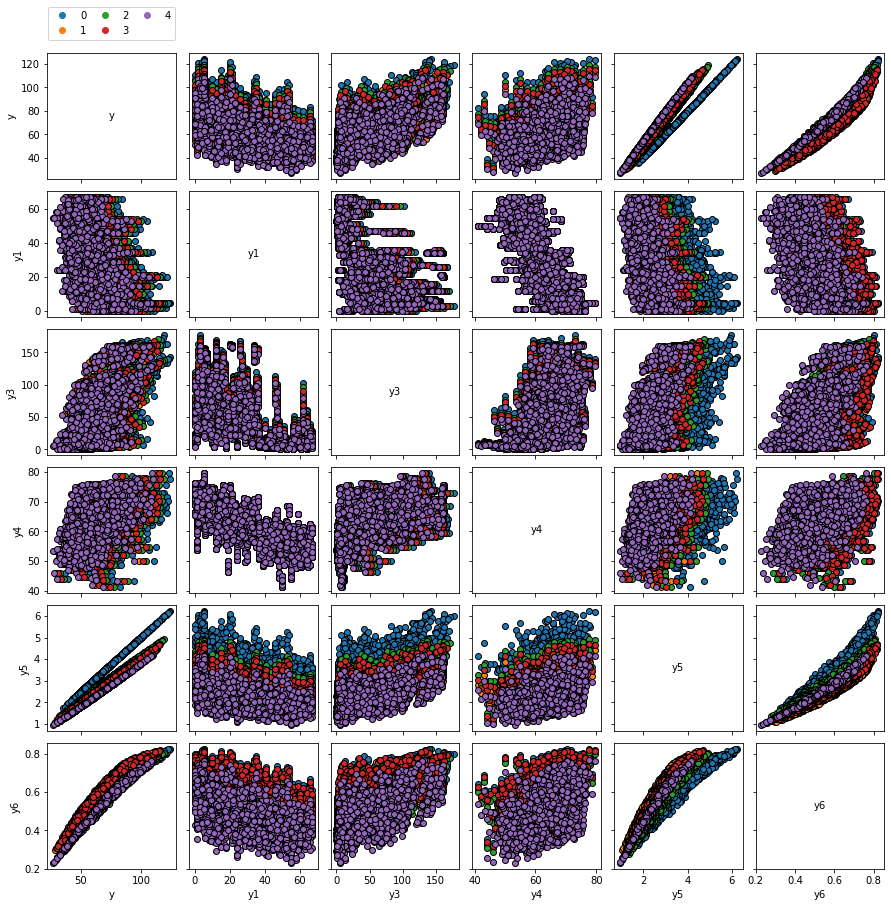

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
plt.show()

### Assign the address of outputs folders

In [6]:
import tarfile

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '7500_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '7500_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '7500_runs')

In [7]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'y.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'y1.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'y3.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'y4.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'y5.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'y6.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]

Make a database from the outputs of ema by concatinating the individual outs and experiments

In [8]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_87,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6
0,1.018676,928.463098,5.746679,-1.905487,2.508234,0.778872,2.383207,210.609049,84.578159,0,0,UZHModel,91.300732,30,39.069119,154.412280,145.859019,43.151280,139.438965,140.060676,105.249476,134.349653,148.787132,108.322109,133.537934,127.340416,164.861146,131.008162,118.735212,130.825164,18.930431,125.469238,108.573739,123.960660,...,105.636761,32.737482,122.348237,26.813710,93.482960,30.886185,100.916815,57.989999,85.662523,39.306004,98.975235,23.724527,9.415882,81.065780,137.334237,68.662245,67.515891,88.293389,93.347009,55.841713,11.303930,105.496420,106.954404,51.069980,26.698188,66.497957,72.407824,64.440344,12.812318,87.802667,124.432826,58.960424,4.578220,0.714259
1,1.268924,915.882127,5.959716,-1.104218,1.764010,0.251050,1.725426,210.609049,84.578159,1,0,UZHModel,93.092528,17,126.048447,110.514358,70.454380,96.943269,145.112083,147.006136,69.541841,131.487197,142.103715,111.565469,136.694996,143.606194,117.727663,100.199688,103.541138,104.762453,134.052028,140.454645,121.663945,106.947644,...,94.557817,49.050931,42.670674,84.399327,69.534809,54.255967,89.742499,61.034281,115.685540,60.787179,124.649420,86.028762,6.453806,79.368166,125.363752,64.895147,71.102969,17.130935,119.942602,74.763945,68.111215,140.698749,70.983601,46.821540,49.008901,55.604021,54.921382,82.887930,44.019571,96.666448,25.607494,68.468898,4.663898,0.737481
2,1.307259,950.846496,4.661690,-1.900103,2.931211,0.030276,2.848986,210.609049,84.578159,2,0,UZHModel,64.866489,37,75.160839,74.334793,136.040859,152.883962,117.388666,163.465346,124.409743,159.325365,143.431838,138.234596,137.934903,131.248944,85.648771,127.110577,150.300629,124.640121,125.511566,114.157391,62.219406,95.017457,...,11.321641,29.770136,48.719934,6.413305,58.964647,6.666998,68.150778,10.572290,40.709172,13.500227,18.860728,15.815750,23.502077,5.791584,13.808429,43.486715,55.531158,3.536790,14.779327,17.084024,10.417121,6.972777,43.836727,14.848507,13.976275,7.750094,27.741733,89.526776,24.081254,14.238087,11.135466,50.556186,3.240508,0.535163
3,1.254362,977.846404,4.247202,-1.237006,1.256139,0.160437,3.265695,210.609049,84.578159,3,0,UZHModel,71.594791,41,62.308956,92.758424,151.849721,71.467680,87.307279,71.809394,139.538477,122.187551,125.279486,141.278482,77.841163,144.843501,112.198594,128.010281,137.258438,148.327011,115.330138,82.156650,33.692380,54.494525,...,60.350921,50.776451,60.759925,17.600953,34.102713,16.198592,87.469893,33.207548,16.807445,7.868655,48.516719,21.168891,31.633636,57.022099,25.997459,25.557591,21.940558,3.552886,11.335790,10.751105,20.598165,47.149073,30.173965,21.464890,24.181107,16.500716,95.637355,27.776727,16.613199,21.257776,7.058481,61.382119,3.588814,0.605891
4,1.225268,1016.835183,4.455592,-1.336806,1.249031,0.019954,2.669777,210.609049,84.578159,4,0,UZHModel,73.787603,37,57.129169,161.282842,109.914918,157.946516,26.449196,112.478566,110.123677,80.580520,125.524727,121.118359,122.816231,113.086357,159.089927,83.434637,125.027607,51.654381,28.655606,81.783912,107.320892,47.769363,...,41.800578,100.710698,100.281856,81.477791,19.098277,48.998702,39.486385,90.122393,29.943870,22.634355,69.853077,70.775687,36.812921,29.967041,55.889461,85.138720,5.827480,24.039898,16.706357,31.234956,2.907045,39.619760,34.341544,21.103177,25.457596,21.573812,11.529562,26.902168,105.671345,10.397606,9.412131,60.347712,3.695847,0.608118


In [9]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values

In [10]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [11]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [12]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

7500
7500
7500
7500


In [13]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [14]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [15]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(7500, 119, 2)
(7500, 119, 2)
(7500, 119, 2)
(7500, 119, 2)


#### Check the header of outputs

In [16]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_Ver1_45_6
Money_sc_Ver1_45_6
ArtSnowPossibility_sc_Ver1_45_6
isOverSnow_sc_Ver1_45_6


In [17]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [18]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
7500
1785000
<U47
str1504
#########
(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
7500
#########
(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
7500
#########
(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
7500
#########
(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
7500


In [19]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [20]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [21]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[27.05888759]
[44.24958132]
[68.75058575]
[92.16036555]
[113.52622351]
(118, 1)
[1.06]
[1.79]
[2.83]
[3.96]
[4.93]
(118, 1)
[50.806]
[57.0175]
[64.755]
[74.545]
[83.84]
(118, 1)
[31.61157882]
[51.68288053]
[80.14827574]
[100.]
[100.]
(118, 1)


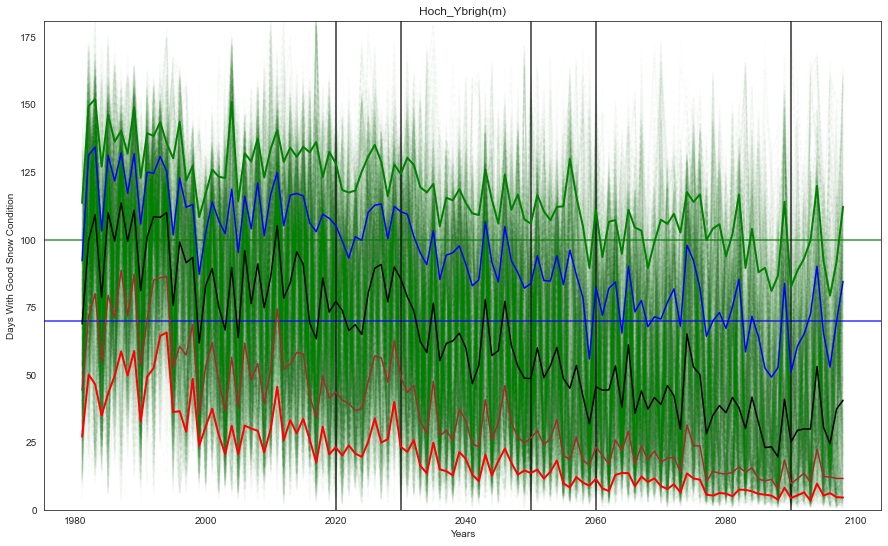

In [103]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

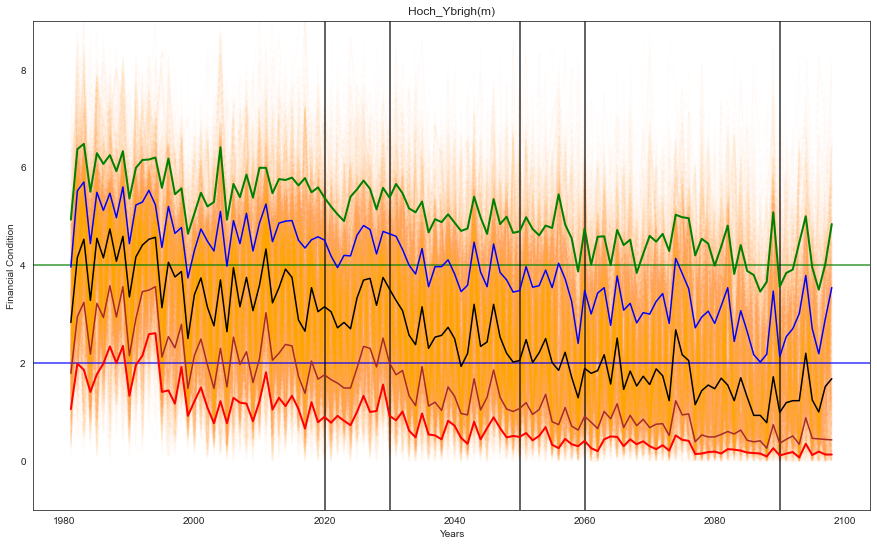

In [102]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

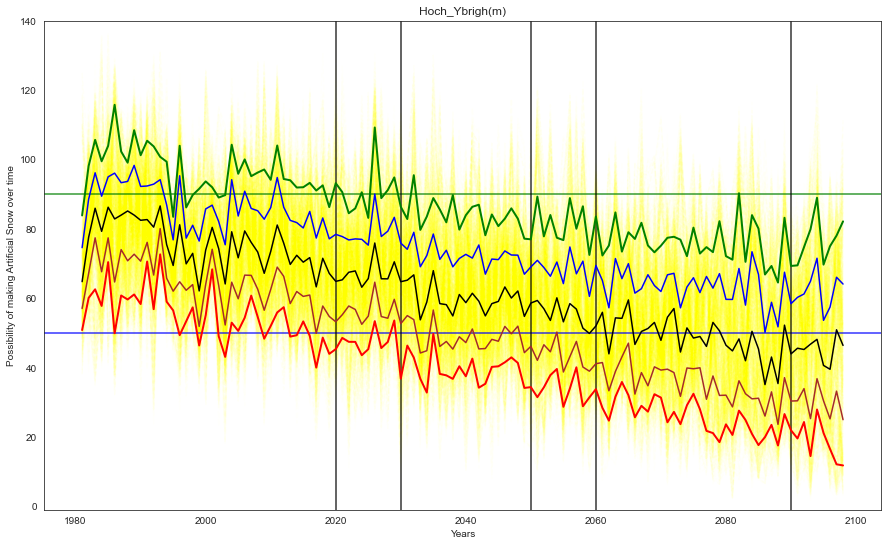

In [101]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=0.01)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

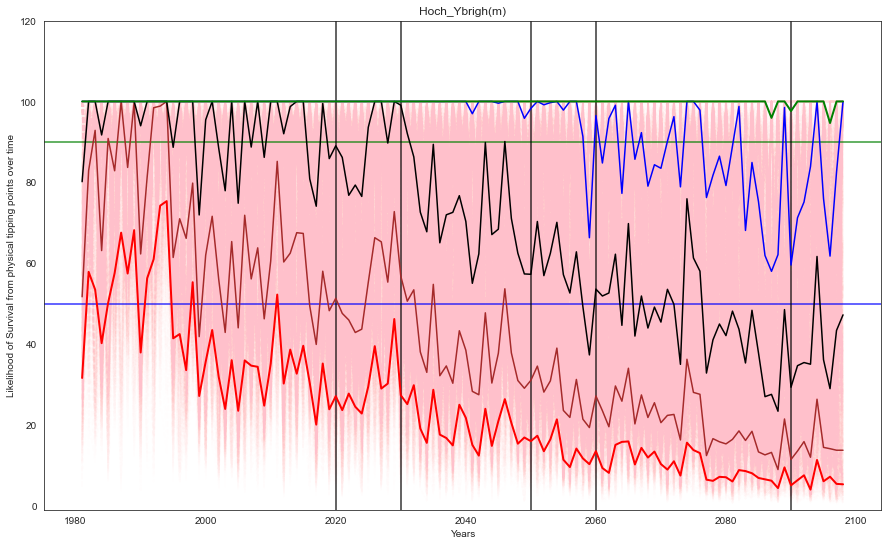

In [100]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, 7500, 5):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

In [37]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['y'] < 80
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 5916 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.1416, coverage: 0.1795131845841785, density: 1.0 restricted_dimensions: 3


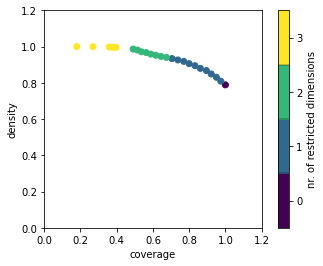

In [38]:
#import mpld3
box1.show_tradeoff()
plt.show()
#mpld3.display()
fig.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage    0.588235
density     0.958678
id                14
mass           0.484
mean        0.958678
res_dim            2
Name: 14, dtype: object

            box 14                                          
               min       max                       qp values
X5temp    3.001334  4.787513  [-1.0, 4.942843514485754e-142]
Xfactor1  1.055939  3.488033   [7.461502159561645e-11, -1.0]



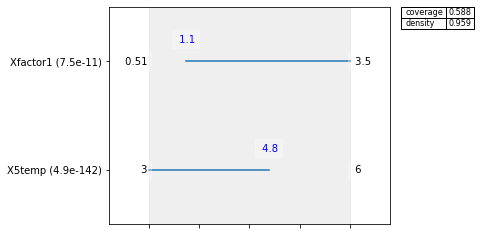

In [39]:
# Saeed : explore the inspect effect
box1.inspect(14)
box1.inspect(14, style='graph')
plt.show()

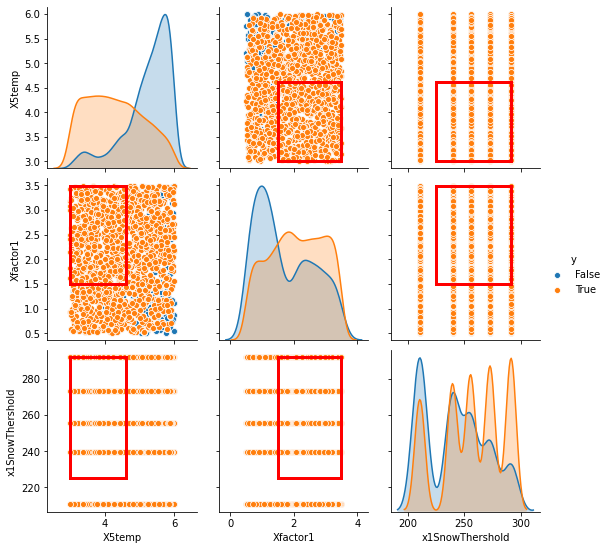

In [45]:
# fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(21)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays.svg'), format='svg', dpi=600)

In [46]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 6438 points remaining, containing 4854 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] 

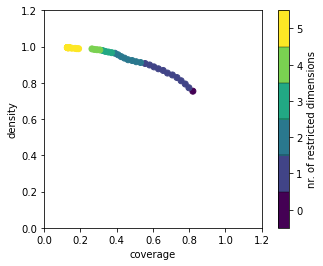

In [47]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

### likelihood of survival analysis

In [48]:
x = experiments
y = outcomes['y6'] < 0.6
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 4630 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.06373333333333334, coverage: 0.10323974082073434, density: 1.0 restricted_dimensions: 4


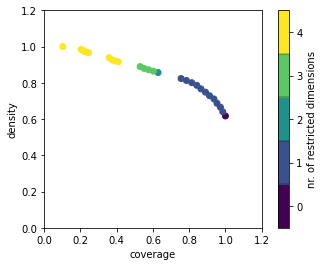

In [49]:
box1.show_tradeoff()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

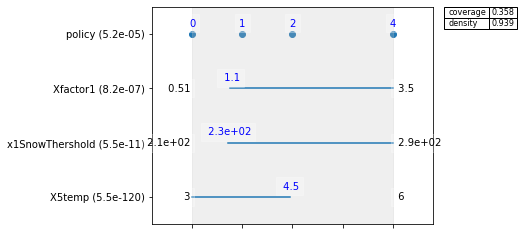

In [51]:
# Saeed : explore the inspect effect
box1.inspect(20, style='graph')
plt.show()

policy [0, 2, 4, 1, 3]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


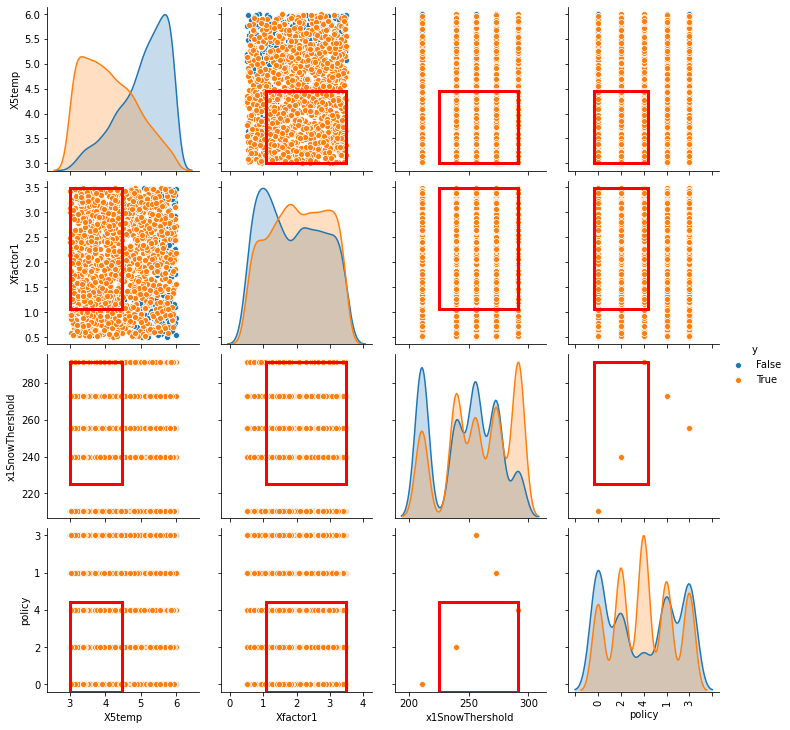

In [52]:
#fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(21)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Artifical snow analysis

In [53]:
x = experiments
y = outcomes['y4'] < 60
prim_alg = prim.Prim(x, y, threshold=0.8)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 7500 points remaining, containing 2765 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.16933333333333334, coverage: 0.4593128390596745, density: 1.0 restricted_dimensions: 4


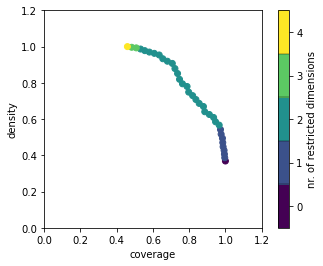

In [54]:
box1.show_tradeoff()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

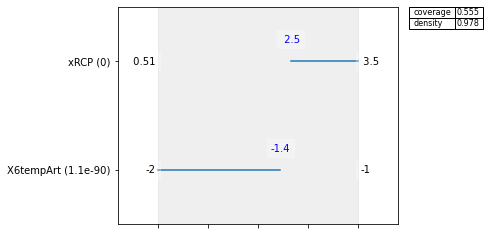

In [55]:
# Saeed : explore the inspect effect
box1.inspect(30, style='graph')
plt.show()

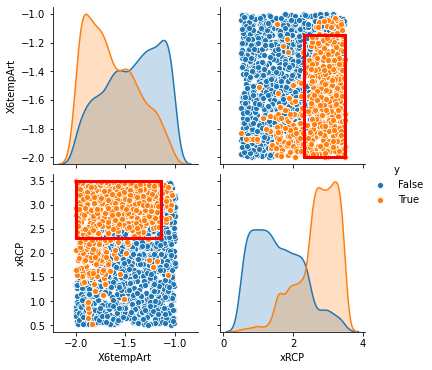

In [56]:
#fig, axs = plt.subplots()
axs = box1.show_pairs_scatter(21)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial.svg'), format='svg', dpi=600)

### Visualization with ema-workbench - part3

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


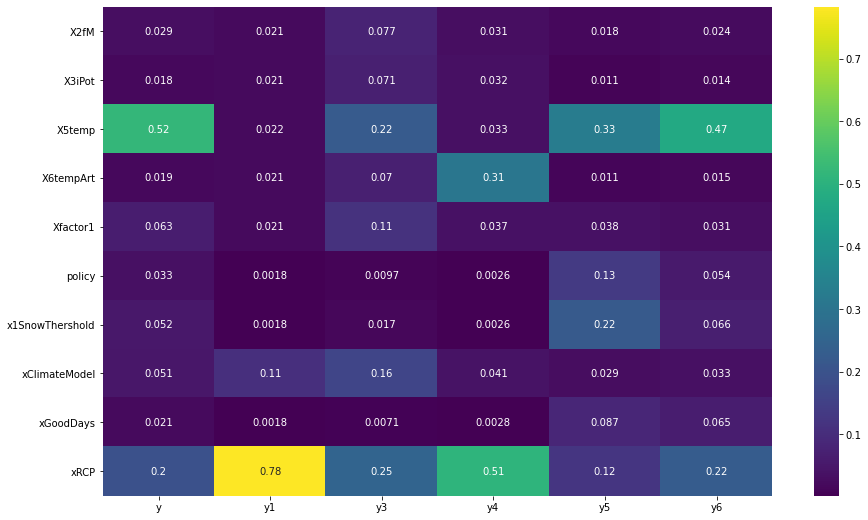

In [57]:
from ema_workbench.analysis import feature_scoring

fig, ax = plt.subplots(figsize=(15,9))

x = experiments
Y = outcomes

fs = feature_scoring.get_feature_scores_all(x, Y)
ax = sns.heatmap(fs, cmap='viridis', annot=True)
plt.show()

fig.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=600)

In [58]:
x = experiments
Y = outcomes['y'] < 70
#fs, alg = feature_scoring.get_ex_feature_scores(x, y, mode=feature_scoring.CLASSIFICATION)
fs, alg = feature_scoring.get_ex_feature_scores(x, Y)

fs.sort_values(ascending=False, by=1)

[MainProcess/INFO] model dropped from analysis because only a single category


,1
0,
X5temp,0.484897
xRCP,0.204184
Xfactor1,0.067458
xClimateModel,0.054243
x1SnowThershold,0.043687
X2fM,0.040869
X6tempArt,0.029857
X3iPot,0.029679
policy,0.025913


[MainProcess/INFO] model dropped from analysis because only a single category


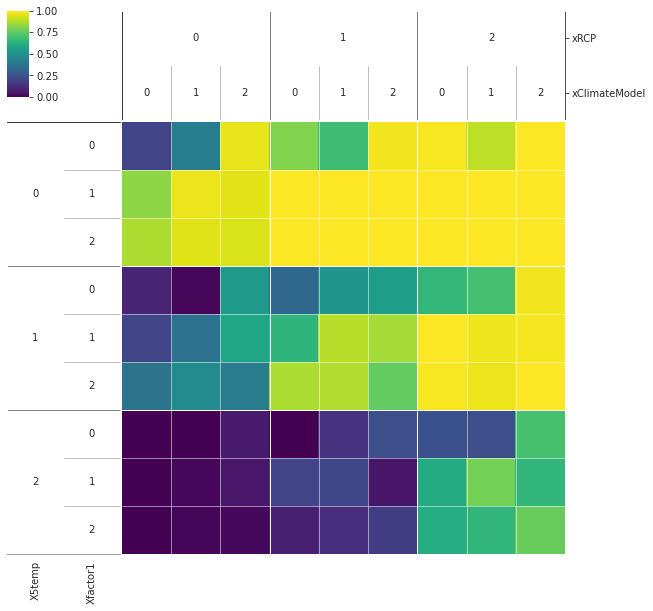

In [59]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


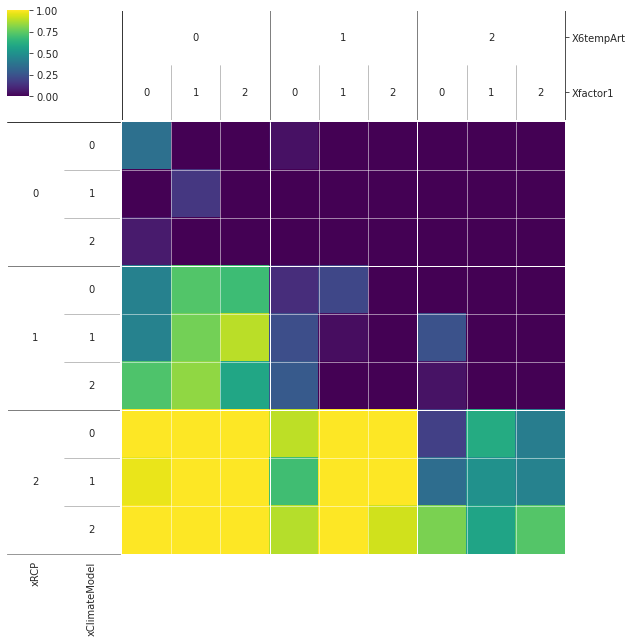

In [60]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y4'] < 60
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


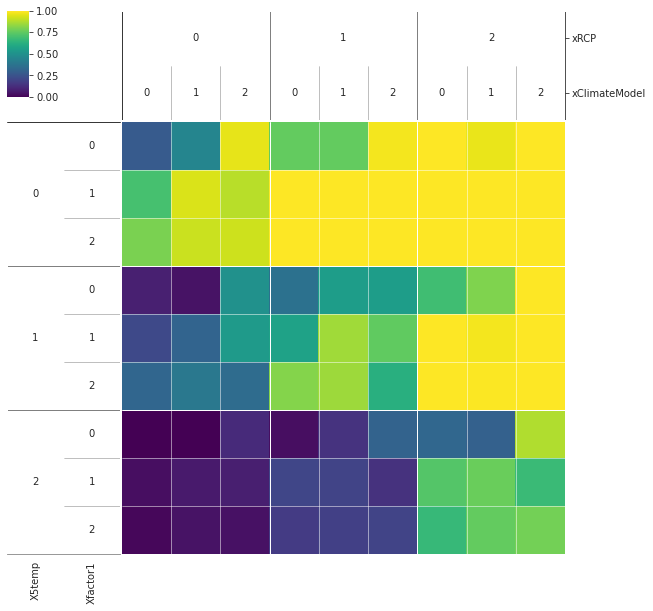

In [61]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['y6'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

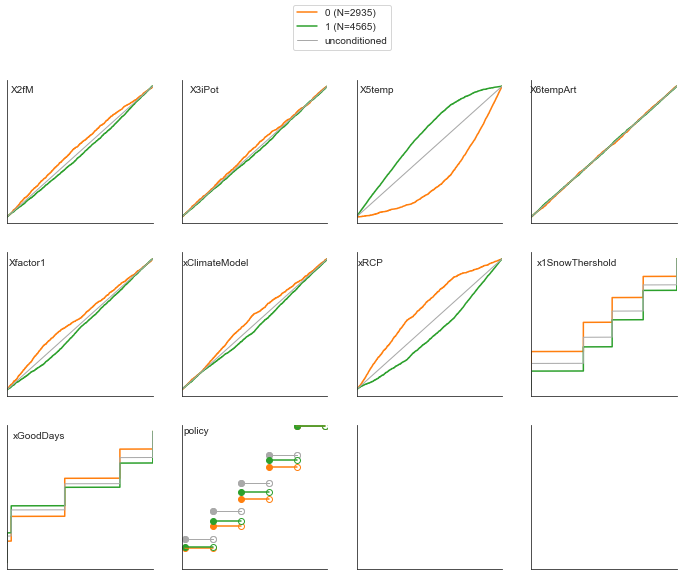

In [62]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y'] < 70
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

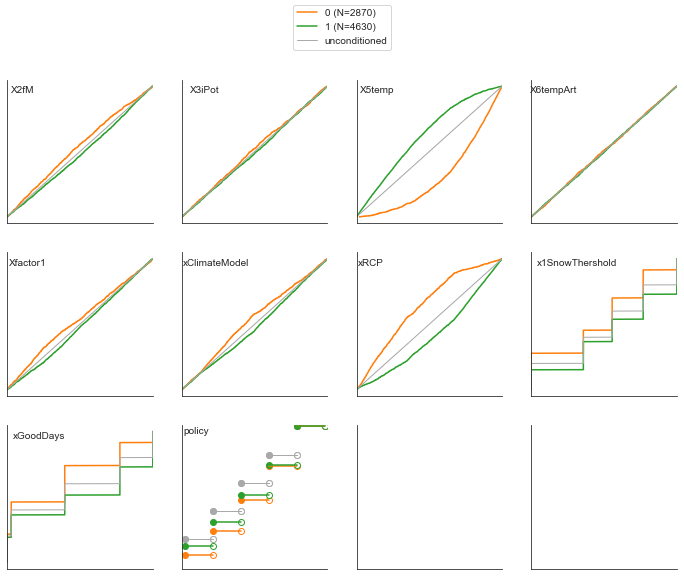

In [63]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y6'] < 0.6
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

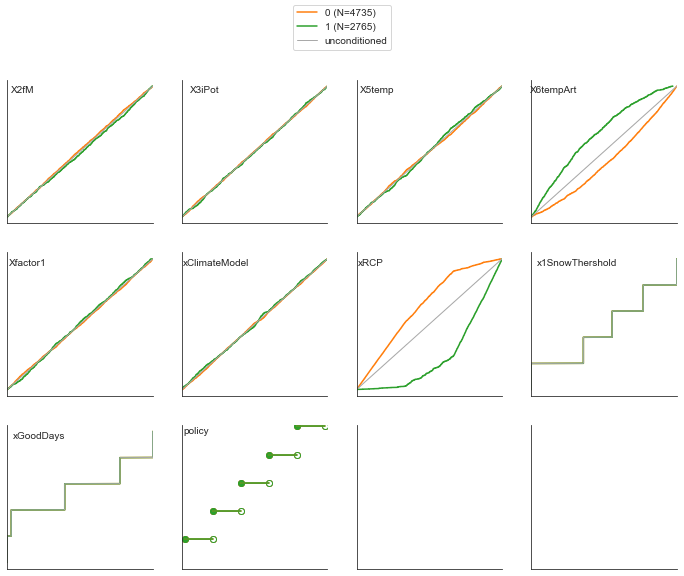

In [64]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['y4'] < 60
fig = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

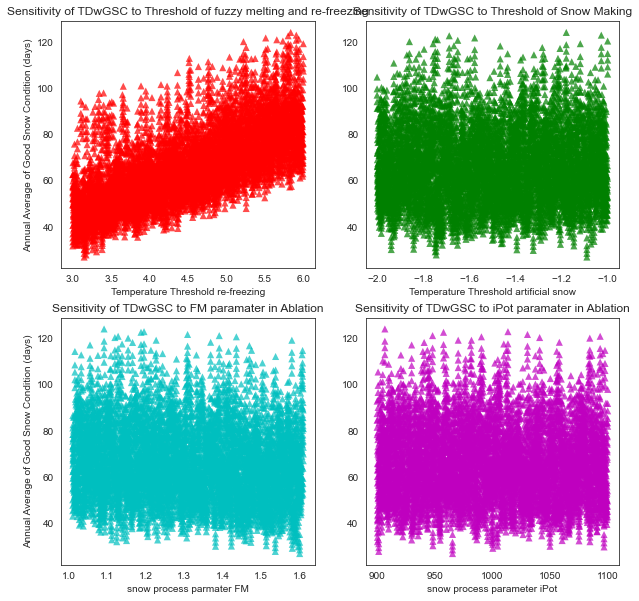

In [65]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing")
axs[0,1].set_xlabel("Temperature Threshold artificial snow")
axs[1,0].set_xlabel("snow process parmater FM")
axs[1,1].set_xlabel("snow process parameter iPot")


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing')
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making')
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation')
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation')


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

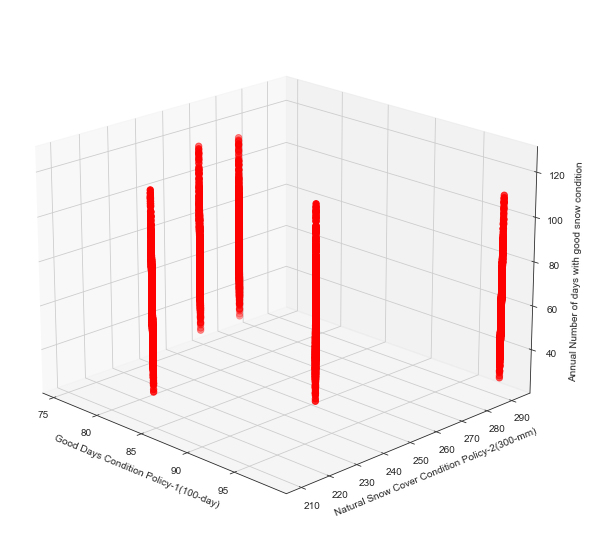

In [66]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)')
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)')
ax.set_zlabel('Annual Number of days with good snow condition')


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

### Defining the Q0.9 and Q0.1 databases

In [67]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

#print(q10_years_Art[0])
#print(q25_years_Art[0])
#print(q50_years_Art[0])
#print(q75_years_Art[0])
#print(q90_years_Art[0])
#print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[27.05888759]
[44.24958132]
[68.75058575]
[92.16036555]
[113.52622351]
(118, 1)
[1.06]
[1.79]
[2.83]
[3.96]
[4.93]
(118, 1)
[31.61157882]
[51.68288053]
[80.14827574]
[100.]
[100.]
(118, 1)


In [68]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
#print(matrix_Art26.shape)
#print(matrix_Art45.shape)
#print(matrix_Art85.shape)
#print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
7500
#########
(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
7500
#########
#########
(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
7500


In [69]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[600, 0, 1:2])
print(matrix_GoodDays[3333].shape)

(7500, 119, 1)
['isOverSnow_sc_Ver2_26_3']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [71]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [77]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [78]:
dfq50_26.head()

,median26
0,70.352397
1,94.329321
2,108.356319
3,72.306180
4,107.273419


In [79]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [80]:
dfAllAverages.head()

,median26,median45,median85
0,70.352397,68.405553,68.003975
1,94.329321,99.948506,104.952785
2,108.356319,110.799611,108.691447
3,72.306180,78.589858,86.127787
4,107.273419,110.721562,112.164481


In [81]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[27.05888759]
[44.24958132]
[68.75058575]
[92.16036555]
[113.52622351]
(118, 1)
*** RCP2.6***
[29.77615655]
[44.18964195]
[70.35239721]
[91.24329951]
[118.26321525]
(118, 1)
*** RCP4.5***
[25.18450578]
[41.30897372]
[68.40555272]
[94.82377655]
[114.00244529]
(118, 1)
*** RCP8.5***
[26.19599111]
[47.16415373]
[68.00397457]
[90.85112422]
[109.72999246]
(118, 1)


In [82]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[1.06]
[1.79]
[2.83]
[3.96]
[4.93]
(118, 1)
*** RCP2.6***
[1.17]
[1.78]
[2.83]
[3.97]
[5.02]
(118, 1)
*** RCP4.5***
[0.95]
[1.68]
[2.82]
[4.05]
[4.92]
(118, 1)
*** RCP8.5***
[1.09]
[1.8725]
[2.83]
[3.83]
[4.801]
(118, 1)


### RCP 2.6 Number of days with Good Snow Condition over the time

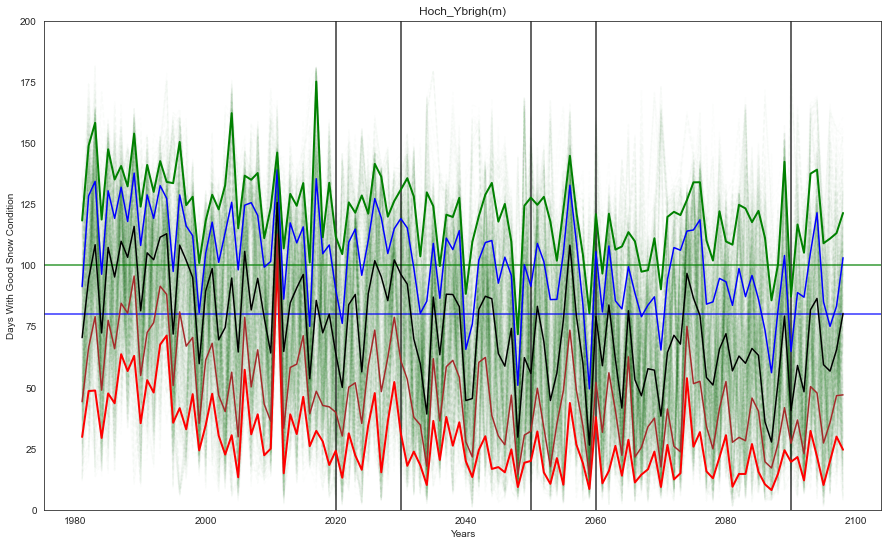

In [98]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), 5):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='green', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

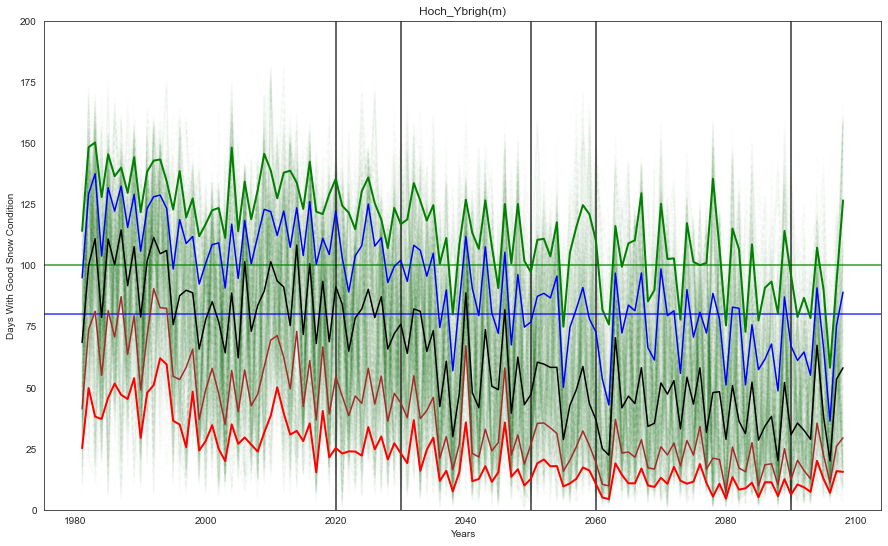

In [99]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), 5):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

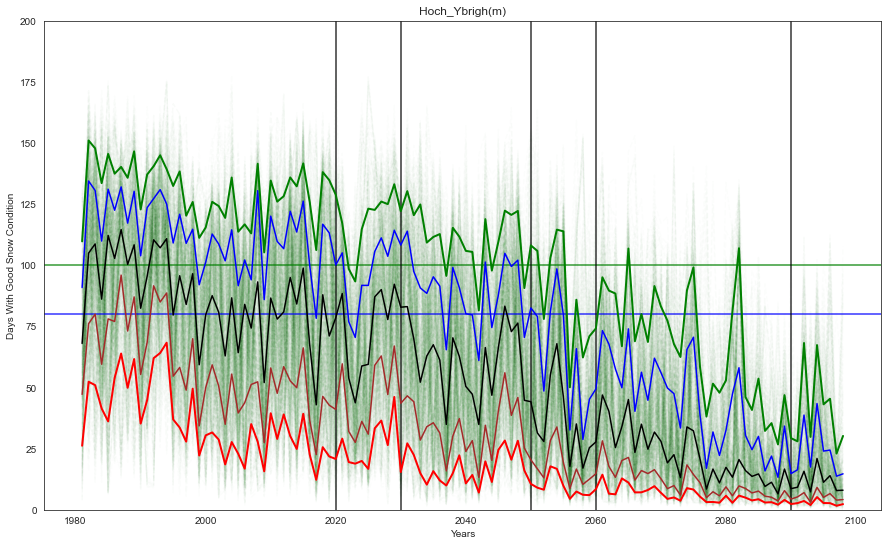

In [97]:
fig, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), 5):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

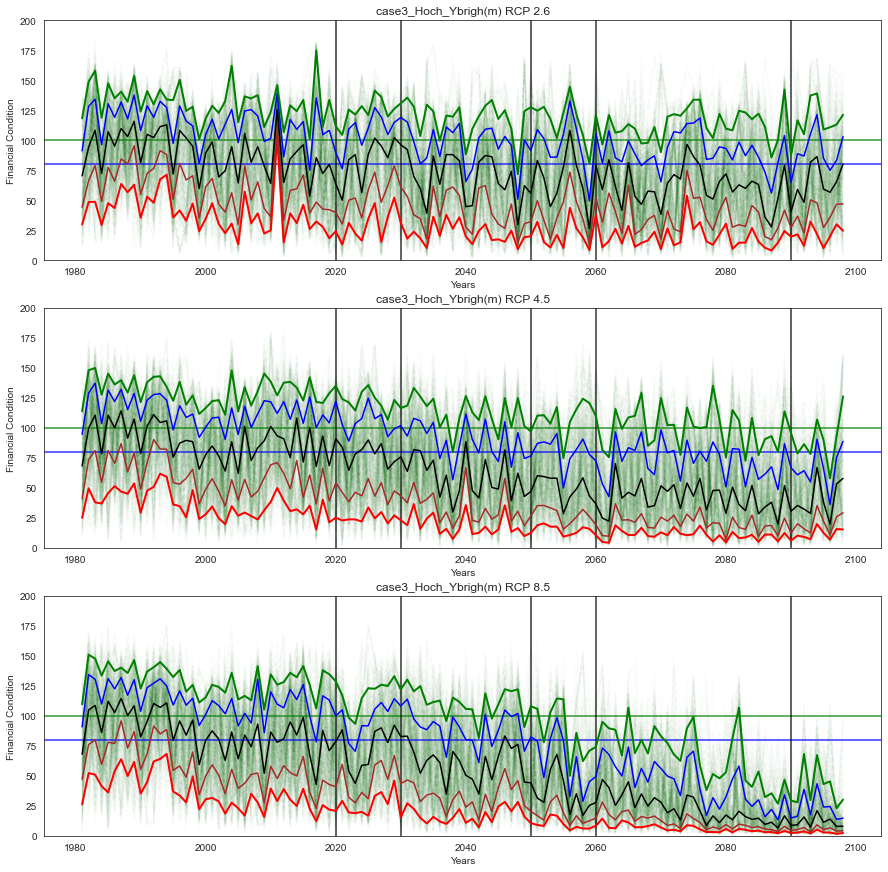

In [96]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays26), 5):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_GoodDays45), 5):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_GoodDays85), 5):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Financial Condition')

axs[1].set_ylim(bottom=0, top =200)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Condition')

axs[2].set_ylim(bottom=0, top =200)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Financial Condition')

fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
plt.show()

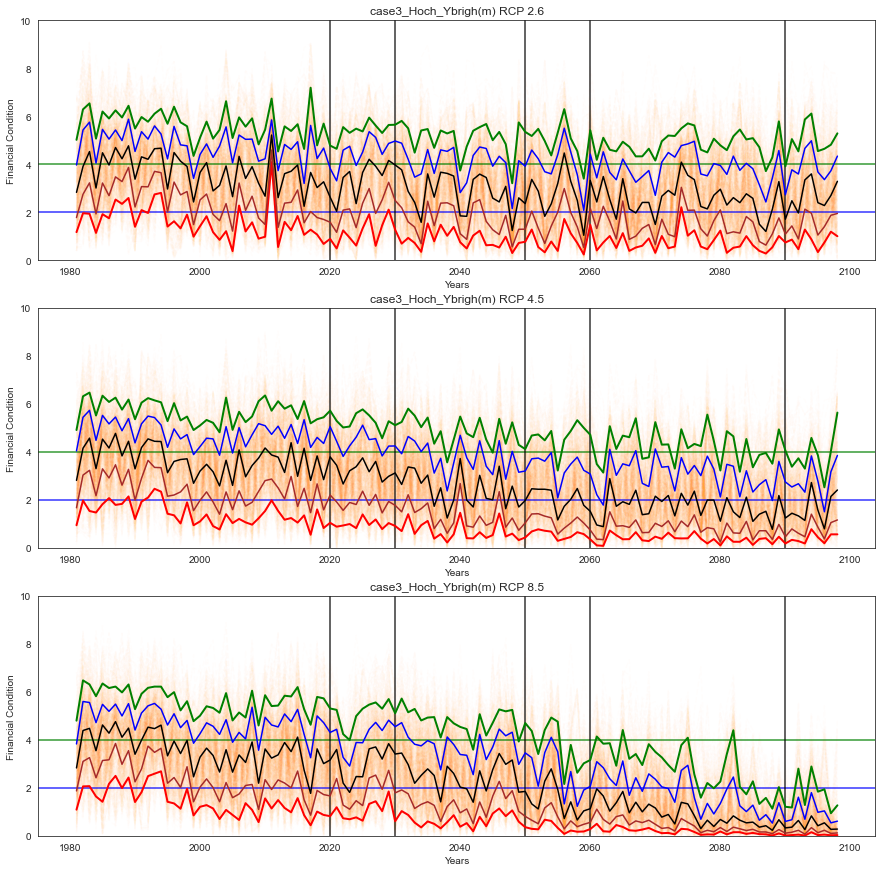

In [95]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_fin26), 5):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_fin45), 5):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_fin85), 5):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=4, color='green', alpha=0.8)
axs[0].axhline(y=2, color='blue', alpha=0.8)
axs[1].axhline(y=4, color='green', alpha=0.8)
axs[1].axhline(y=2, color='blue', alpha=0.8)
axs[2].axhline(y=4, color='green', alpha=0.8)
axs[2].axhline(y=2, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Financial Condition')

axs[1].set_ylim(bottom=0, top =10)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Condition')

axs[2].set_ylim(bottom=0, top =10)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Financial Condition')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)

plt.show()

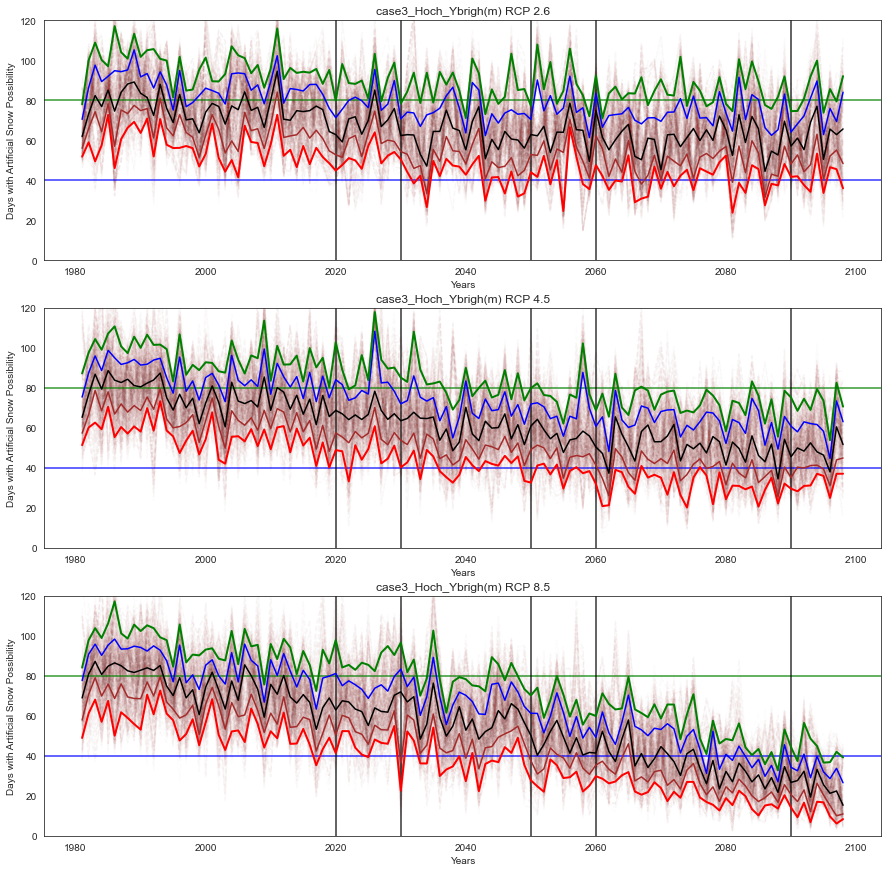

In [93]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), 5):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Art45), 5):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Art85), 5):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=40, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=40, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=40, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =120)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Days with Artificial Snow Possibility')

axs[1].set_ylim(bottom=0, top =120)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Artificial Snow Possibility')

axs[2].set_ylim(bottom=0, top =120)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Days with Artificial Snow Possibility')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)

plt.show()

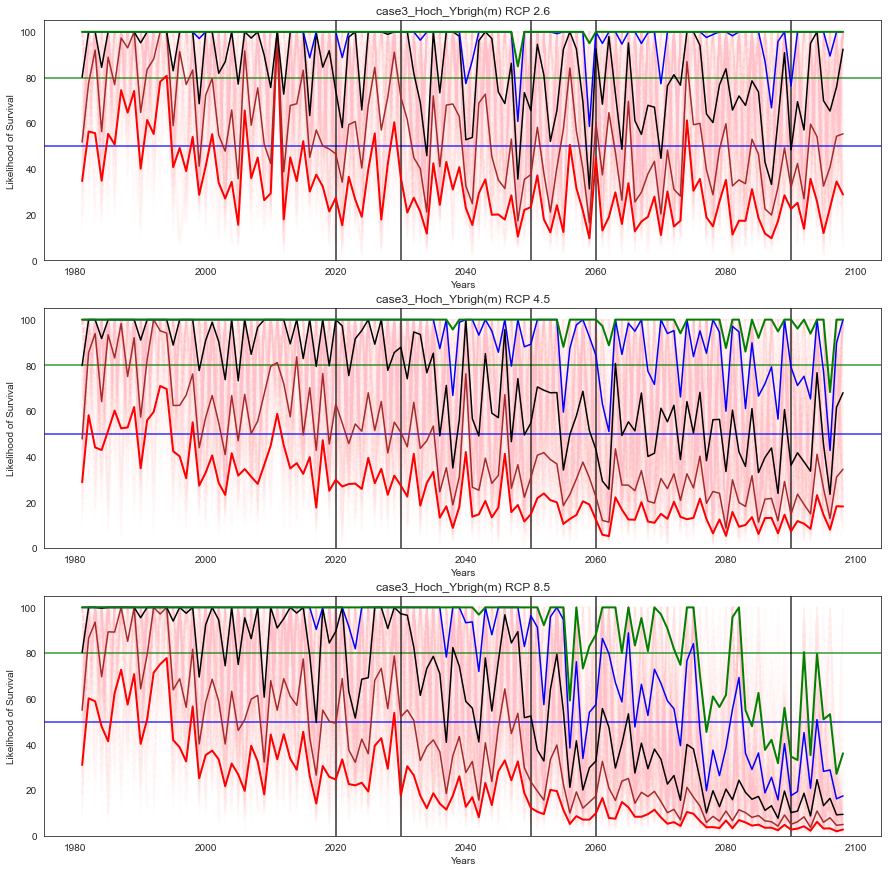

In [94]:
fig, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), 5):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Like45), 5):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)


for i in range(0, len(matrix_Like85), 5):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=0.01)    


axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='black', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='black', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='black', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='brown',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='green', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='brown',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='green', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='brown',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='green', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title('case3_Hoch_Ybrigh(m) RCP 2.6')
axs[0].set_xlabel('Years')
axs[0].set_ylabel('Likelihood of Survival')

axs[1].set_ylim(bottom=0, top =105)
axs[1].set_title('case3_Hoch_Ybrigh(m) RCP 4.5')
axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival')

axs[2].set_ylim(bottom=0, top =105)
axs[2].set_title('case3_Hoch_Ybrigh(m) RCP 8.5')
axs[2].set_xlabel('Years')
axs[2].set_ylabel('Likelihood of Survival')


fig.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)

plt.show()

In [104]:
dfAllAverages.head()

,median26,median45,median85
0,70.352397,68.405553,68.003975
1,94.329321,99.948506,104.952785
2,108.356319,110.799611,108.691447
3,72.306180,78.589858,86.127787
4,107.273419,110.721562,112.164481


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [105]:
y_axis = np.arange(1981, 2100, step= 20)

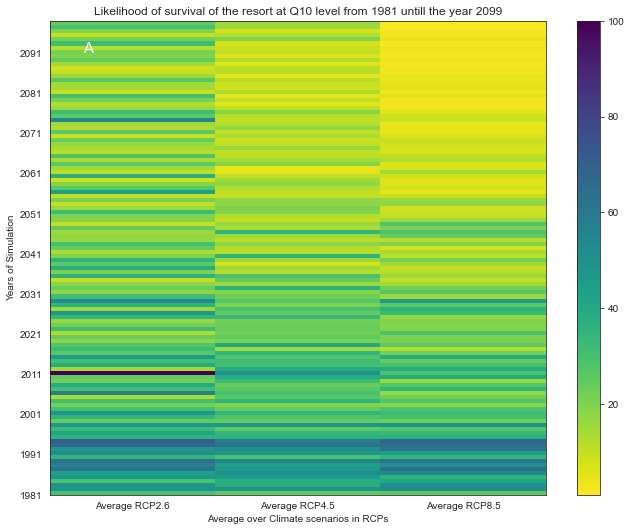

In [106]:
from matplotlib.ticker import FuncFormatter


fig, (ax3) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='viridis_r', vmin=1, vmax=100)
cb3 = fig.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


ax3.set_xlabel("Average over Climate scenarios in RCPs")

ax3.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099))

ax3.text(0.2, 110, 'A', color = 'white', fontsize=15)

fig.savefig(os.path.join(rootVisualization, 'Likelihood_All.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

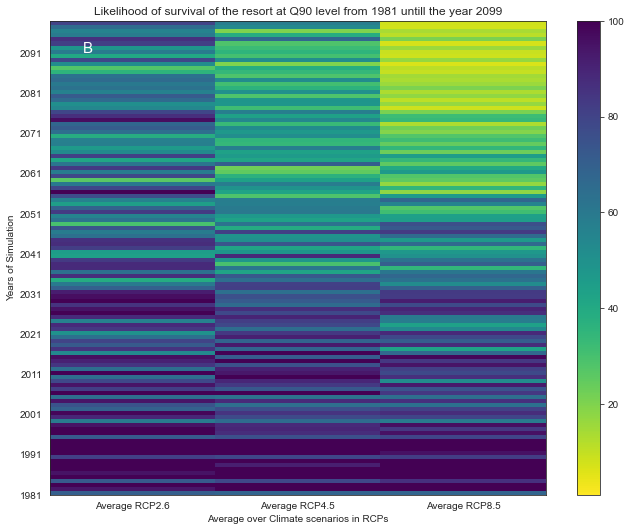

In [107]:
from matplotlib.ticker import FuncFormatter


fig, (ax4) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='viridis_r' ,vmin=1, vmax=100)
cb4 = fig.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


ax4.set_xlabel("Average over Climate scenarios in RCPs")

ax4.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q90 level from {} untill the year {}".format(1981, 2099))

ax4.text(0.2, 110, 'B', color = 'white', fontsize=15)


fig.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

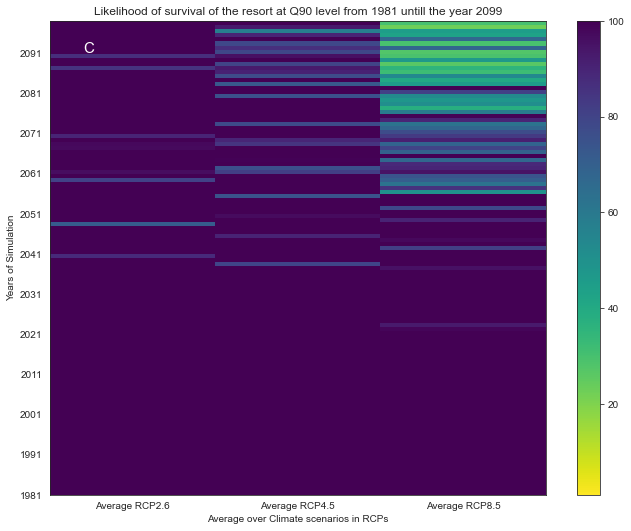

In [108]:
from matplotlib.ticker import FuncFormatter


fig, (ax4) = plt.subplots(1, 1, figsize=(9.5,7.5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='viridis_r' ,vmin=1, vmax=100)
cb4 = fig.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


ax4.set_xlabel("Average over Climate scenarios in RCPs")

ax4.set_ylabel("Years of Simulation")
plt.xticks(x_axis, ('Average RCP2.6', 'Average RCP4.5', 'Average RCP8.5'))
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
plt.title("Likelihood of survival of the resort at Q90 level from {} untill the year {}".format(1981, 2099))

ax4.text(0.2, 110, 'C', color = 'white', fontsize=15)


fig.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)


fig.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [109]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(2495, 119, 2)
(2515, 119, 2)
(2490, 119, 2)
(7500, 119, 2)


In [110]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [111]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [112]:
df26_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver1_26_3'],sc_2_['isOverSnow_sc_Ver2_26_6'],sc_3_['isOverSnow_sc_Ver2_26_9'],sc_4_['isOverSnow_sc_Ver2_26_8'],sc_5_['isOverSnow_sc_Ver1_26_10'],sc_6_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_7_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_8'],sc_11_['isOverSnow_sc_Ver2_26_11'],sc_12_['isOverSnow_sc_Ver2_26_11'],sc_13_['isOverSnow_sc_Ver2_26_5'],sc_14_['isOverSnow_sc_Ver1_26_3'],sc_15_['isOverSnow_sc_Ver1_26_10'],sc_16_['isOverSnow_sc_Ver1_26_11'],sc_17_['isOverSnow_sc_Ver1_26_10'],sc_18_['isOverSnow_sc_Ver2_26_7'],sc_19_['isOverSnow_sc_Ver1_26_2'],sc_20_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_21_['isOverSnow_sc_Ver1_26_9'],sc_22_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_25_['isOverSnow_sc_Ver1_26_11'],sc_26_['isOverSnow_sc_Ver1_26_9'],sc_27_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_9'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_10'],sc_32_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_33_['isOverSnow_sc_Ver1_26_5'],...,sc_2462_['isOverSnow_sc_Ver2_26_3'],sc_2463_['isOverSnow_sc_Ver1_26_11'],sc_2464_['isOverSnow_sc_Ver2_26_6'],sc_2465_['isOverSnow_sc_Ver1_26_4'],sc_2466_['isOverSnow_sc_Ver1_26_7'],sc_2467_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2468_['isOverSnow_sc_Ver1_26_11'],sc_2469_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver1_26_10'],sc_2471_['isOverSnow_sc_Ver2_26_2'],sc_2472_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2474_['isOverSnow_sc_Ver1_26_8'],sc_2475_['isOverSnow_sc_Ver2_26_7'],sc_2476_['isOverSnow_sc_Ver2_26_8'],sc_2477_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2478_['isOverSnow_sc_Ver1_26_2'],sc_2479_['isOverSnow_sc_Ver2_26_7'],sc_2480_['isOverSnow_sc_Ver1_26_6'],sc_2481_['isOverSnow_sc_Ver1_26_12'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver2_26_6'],sc_2484_['isOverSnow_sc_Ver2_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_5'],sc_2486_['isOverSnow_sc_Ver2_26_9'],sc_2487_['isOverSnow_sc_Ver2_26_6'],sc_2488_['isOverSnow_sc_Ver2_26_7'],sc_2489_['isOverSnow_sc_Ver2_26_6'],sc_2490_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_sc_Ver2_26_8'],sc_2492_['isOverSnow_sc_Ver2_26_6'],sc_2493_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_8'],sc_2495_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp']
0,1981-1982,21.819955183735523,100.04660372843881,77.29399737086544,46.38836777738369,84.8337245928463,51.99705367335878,79.70611964145495,88.56053511898068,71.84709625992608,93.40847718724291,144.08297240122167,143.026449230898,14.499234583964604,30.840745189430645,99.38489924584897,71.94084258745647,95.20502185603422,83.92343270260777,67.81940329895126,47.410118749205544,135.1027584772029,135.37100094597696,58.44226583084973,100.73375387163237,83.57805803752557,105.53528408120351,61.752142613912675,76.2071539986148,113.61751945959612,66.2530797944416,117.60234128761802,89.82087964841351,15.398768584669357,...,106.2478364721391,40.05046345001117,126.36210156043592,45.683554755137116,114.02736935753217,86.79589099976755,51.63489993411868,99.62631936470203,130.4124816566418,76.17430382222143,101.73701644102897,49.13087203854159,97.24023272591447,54.658857636383814,49.42489448168938,88.15820091600072,64.98861324416016,50.37096019633923,123.24420308752369,42.95432728823242,94.6395892475424,118.44285589190278,93.15303209170591,59.84163590573862,42.00849898028631,100.77221357793846,47.774158188815164,126.4452843516944,105.03829910141435,18.06422861093291,113.13978019002525,91.35100899771257,105.7002070626282,60.386452756542

In [113]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_Ver1_45_1'], dtype='<U47')

In [114]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [115]:
df45_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver2_45_19'],sc_2_['isOverSnow_sc_Ver1_45_6'],sc_3_['isOverSnow_sc_Ver1_45_1'],sc_4_['isOverSnow_sc_Ver1_45_1'],sc_5_['isOverSnow_sc_Ver1_45_14'],sc_6_['isOverSnow_sc_Ver1_45_5'],sc_7_['isOverSnow_sc_Ver1_45_13'],sc_8_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_9_['isOverSnow_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_10_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_11_['isOverSnow_sc_Ver2_45_2'],sc_12_['isOverSnow_sc_Ver2_45_3'],sc_13_['isOverSnow_sc_Ver2_45_17'],sc_14_['isOverSnow_sc_Ver1_45_12'],sc_15_['isOverSnow_sc_Ver1_45_12'],sc_16_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_17_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_18_['isOverSnow_sc_Ver2_45_14'],sc_19_['isOverSnow_sc_Ver1_45_12'],sc_20_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP45-pcp'],sc_21_['isOverSnow_sc_Ver1_45_16'],sc_22_['isOverSnow_sc_Ver2_45_12'],sc_23_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_24_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_25_['isOverSnow_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_26_['isOverSnow_sc_Ver1_45_21'],sc_27_['isOverSnow_sc_Ver1_45_20'],sc_28_['isOverSnow_sc_Ver2_45_16'],sc_29_['isOverSnow_sc_Ver1_45_25'],sc_30_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_31_['isOverSnow_sc_Ver1_45_10'],sc_32_['isOverSnow_sc_Ver2_45_2'],sc_33_['isOverSnow_sc_Ver1_45_20'],...,sc_2482_['isOverSnow_sc_Ver1_45_17'],sc_2483_['isOverSnow_sc_Ver2_45_12'],sc_2484_['isOverSnow_sc_Ver1_45_21'],sc_2485_['isOverSnow_sc_Ver1_45_10'],sc_2486_['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2487_['isOverSnow_sc_Ver1_45_13'],sc_2488_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2489_['isOverSnow_sc_Ver2_45_10'],sc_2490_['isOverSnow_sc_Ver2_45_9'],sc_2491_['isOverSnow_sc_Ver2_45_18'],sc_2492_['isOverSnow_sc_Ver2_45_4'],sc_2493_['isOverSnow_sc_Ver1_45_17'],sc_2494_['isOverSnow_sc_Ver2_45_17'],sc_2495_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_2496_['isOverSnow_sc_Ver2_45_6'],sc_2497_['isOverSnow_sc_Ver2_45_12'],sc_2498_['isOverSnow_sc_Ver2_45_11'],sc_2499_['isOverSnow_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_2500_['isOverSnow_sc_Ver1_45_14'],sc_2501_['isOverSnow_sc_Ver2_45_24'],sc_2502_['isOverSnow_sc_Ver1_45_5'],sc_2503_['isOverSnow_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_2504_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_2505_['isOverSnow_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_2506_['isOverSnow_sc_Ver1_45_13'],sc_2507_['isOverSnow_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_2508_['isOverSnow_sc_Ver1_45_4'],sc_2509_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_2510_['isOverSnow_sc_Ver2_45_12'],sc_2511_['isOverSnow_sc_Ver2_45_16'],sc_2512_['isOverSnow_sc_Ver1_45_3'],sc_2513_['isOverSnow_sc_Ver2_45_6'],sc_2514_['isOverSnow_sc_Ver1_45_16'],sc_2515_['isOverSnow_sc_Ver1_45_10']
0,1981-1982,39.069119099176326,126.0484465550761,142.14485856939208,73.89202937549564,117.56924679310809,77.1643892575098,113.74843915918825,55.90794926776623,112.05187442682792,73.46112947639247,145.90027554128744,40.06883872888545,95.36388095881233,92.2349261550608,91.35482557598803,138.2636026709307,63.158492445893366,62.50913762965488,97.51678673312583,79.43593283136889,76.47611329510868,99.47839018551595,56.87519166039527,138.48215928245057,121.1292530653472,19.036978839090125,121.91561183464329,82.74219872872978,90.69429005590257,70.92932490661568,80.11212797868815,145.91765371200574,113.93711636425405,...,16.37417776790916,90.09131326013029,48.631433796243186,64.41575086788657,88.55395106968021,115.19244169439189,48.759346314302185,26.098878650376406,13.014777946433144,123.67630596706599,42.272827604299174,15.183678111024985,84.70461600576094,91.09643876141833,120.43745453807747,97.79982982695618,100.05781393246683,105.90253869872386,126.55878282712621,23.99336607569961,77.02868758561677,43.74712323490795,94.20272477051799,55.922288632675865,122.65351944125467,108.6862115861252,120.49835945515716,35.613806969364454,98.0341502436085,61.806716835315804,18.941826232206388,100.7202442782839,81.36102756061294,71

In [116]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [117]:
df85_all.head(7)

,Season,sc_1_['isOverSnow_sc_Ver2_85_8'],sc_2_['isOverSnow_sc_Ver2_85_20'],sc_3_['isOverSnow_sc_Ver1_85_7'],sc_4_['isOverSnow_sc_Ver2_85_20'],sc_5_['isOverSnow_sc_Ver1_85_6'],sc_6_['isOverSnow_sc_Ver2_85_1'],sc_7_['isOverSnow_sc_Ver1_85_30'],sc_8_['isOverSnow_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_9_['isOverSnow_sc_Ver2_85_26'],sc_10_['isOverSnow_sc_Ver2_85_15'],sc_11_['isOverSnow_sc_Ver2_85_17'],sc_12_['isOverSnow_sc_Ver1_85_25'],sc_13_['isOverSnow_sc_Ver2_85_7'],sc_14_['isOverSnow_sc_Ver1_85_9'],sc_15_['isOverSnow_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_16_['isOverSnow_sc_Ver2_85_16'],sc_17_['isOverSnow_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_18_['isOverSnow_sc_Ver1_85_29'],sc_19_['isOverSnow_sc_Ver1_85_22'],sc_20_['isOverSnow_sc_Ver2_85_11'],sc_21_['isOverSnow_sc_Ver1_85_8'],sc_22_['isOverSnow_sc_Ver2_85_30'],sc_23_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_24_['isOverSnow_sc_Ver2_85_16'],sc_25_['isOverSnow_sc_Ver2_85_26'],sc_26_['isOverSnow_CLMCOM-CCLM4-ECEARTH-EUR11-RCP85-pcp'],sc_27_['isOverSnow_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_28_['isOverSnow_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_29_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_30_['isOverSnow_sc_Ver2_85_8'],sc_31_['isOverSnow_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_32_['isOverSnow_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_33_['isOverSnow_sc_Ver2_85_6'],...,sc_2457_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2458_['isOverSnow_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_2459_['isOverSnow_sc_Ver1_85_25'],sc_2460_['isOverSnow_sc_Ver1_85_27'],sc_2461_['isOverSnow_sc_Ver2_85_6'],sc_2462_['isOverSnow_sc_Ver1_85_12'],sc_2463_['isOverSnow_sc_Ver1_85_25'],sc_2464_['isOverSnow_sc_Ver1_85_7'],sc_2465_['isOverSnow_sc_Ver1_85_2'],sc_2466_['isOverSnow_sc_Ver2_85_28'],sc_2467_['isOverSnow_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_2468_['isOverSnow_sc_Ver2_85_6'],sc_2469_['isOverSnow_sc_Ver1_85_10'],sc_2470_['isOverSnow_sc_Ver1_85_21'],sc_2471_['isOverSnow_sc_Ver1_85_26'],sc_2472_['isOverSnow_sc_Ver1_85_4'],sc_2473_['isOverSnow_ICTP-REGCM-HADGEM-EUR44-RCP85-pcp'],sc_2474_['isOverSnow_sc_Ver1_85_19'],sc_2475_['isOverSnow_sc_Ver2_85_9'],sc_2476_['isOverSnow_sc_Ver1_85_17'],sc_2477_['isOverSnow_SMHI-RCA-IPSL-EUR11-RCP85-pcp'],sc_2478_['isOverSnow_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_2479_['isOverSnow_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_2480_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_2481_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP85-pcp'],sc_2482_['isOverSnow_sc_Ver1_85_10'],sc_2483_['isOverSnow_sc_Ver2_85_1'],sc_2484_['isOverSnow_sc_Ver1_85_10'],sc_2485_['isOverSnow_sc_Ver2_85_20'],sc_2486_['isOverSnow_sc_Ver2_85_15'],sc_2487_['isOverSnow_sc_Ver2_85_19'],sc_2488_['isOverSnow_sc_Ver1_85_20'],sc_2489_['isOverSnow_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_2490_['isOverSnow_sc_Ver1_85_6']
0,1981-1982,132.34764925168508,33.04777287065305,47.900695961941466,32.9411297793053,52.09728678370387,91.27172871190376,109.56104155666387,80.61759856521243,115.08017773381984,23.006323963973536,20.115897345187467,106.1776025336472,72.72204165782004,80.18642290342692,122.46689287949403,7.80754678658675,19.30168731382905,24.116485192291204,65.35329483377211,109.13919012897212,113.61602725306861,133.76671495762736,59.68000942179043,32.77693930295604,89.80833553894551,59.01555553919014,86.85179460885709,35.15167107974397,92.27999959055828,132.1783104157148,84.3320074259012,27.950650940029906,59.441130796425114,...,92.21976153634373,71.77853993557115,118.24640087231454,80.17974592568451,70.46608339289676,69.40841384883694,97.3112986499169,57.704263351411626,49.78428074990438,103.69865833925256,68.00038409891503,61.1976080351726,90.96726489154237,91.82717225767625,75.87471011528464,75.27658527206748,102.60042617692241,102.08980262316851,70.07571661188285,128.19650028697964,113.06996029990397,86.15507600330795,55.69295375680337,64.8092762201083,87.62091109946384,115.28434980289359,69.28876547772943,109.1671884426653,50.12961254125437,25.688449940843963,112.98166971895247,17.029420270401932,67.24

In [118]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

### Survival Map CH2018 RCP2.6

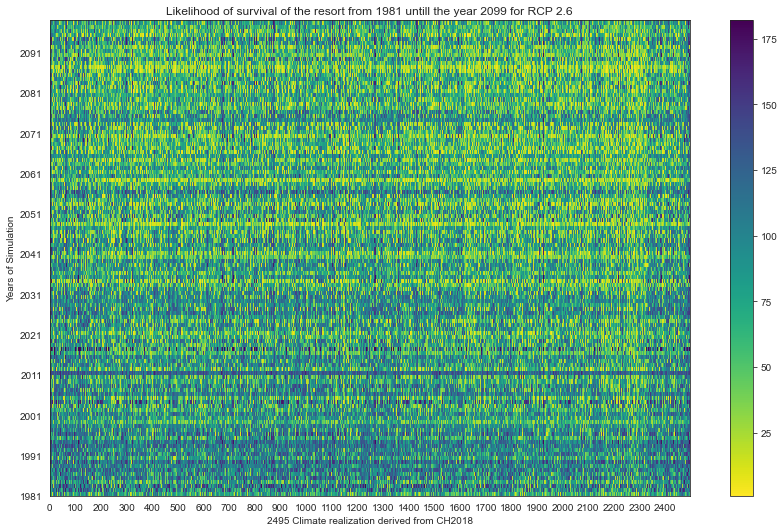

In [119]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='viridis_r')
cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6))

fig.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

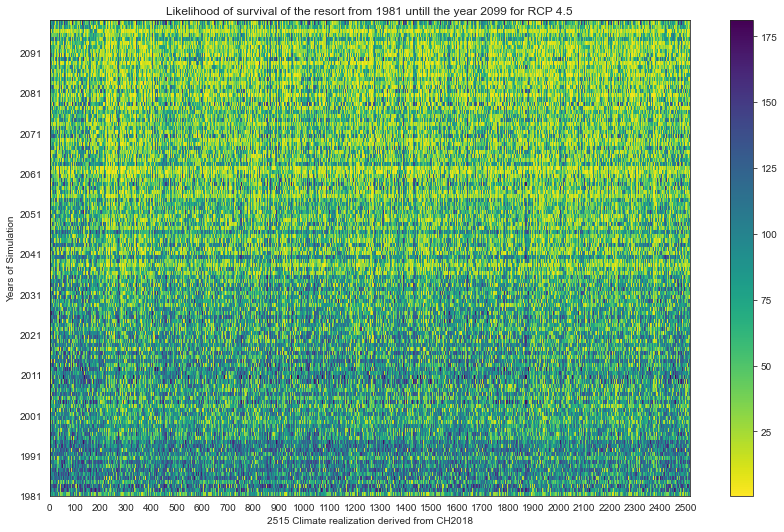

In [120]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='viridis_r')
cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5))

fig.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

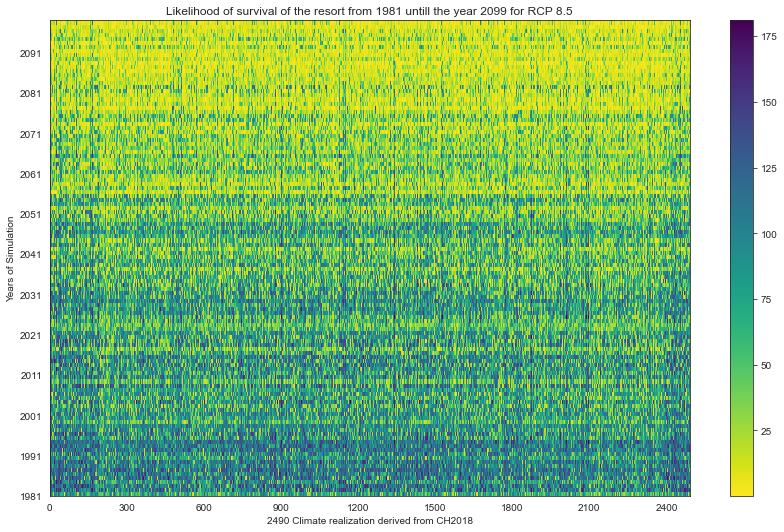

In [121]:
fig, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='viridis_r')

cb3 = fig.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)))
ax3.set_ylabel("Years of Simulation")
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5))

fig.tight_layout()
plt.show()

## 3 years of not having good snow days

In [122]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

In [123]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver1_26_3'],sc_2_['isOverSnow_sc_Ver2_26_6'],sc_3_['isOverSnow_sc_Ver2_26_9'],sc_4_['isOverSnow_sc_Ver2_26_8'],sc_5_['isOverSnow_sc_Ver1_26_10'],sc_6_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_7_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_8'],sc_11_['isOverSnow_sc_Ver2_26_11'],sc_12_['isOverSnow_sc_Ver2_26_11'],sc_13_['isOverSnow_sc_Ver2_26_5'],sc_14_['isOverSnow_sc_Ver1_26_3'],sc_15_['isOverSnow_sc_Ver1_26_10'],sc_16_['isOverSnow_sc_Ver1_26_11'],sc_17_['isOverSnow_sc_Ver1_26_10'],sc_18_['isOverSnow_sc_Ver2_26_7'],sc_19_['isOverSnow_sc_Ver1_26_2'],sc_20_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_21_['isOverSnow_sc_Ver1_26_9'],sc_22_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_25_['isOverSnow_sc_Ver1_26_11'],sc_26_['isOverSnow_sc_Ver1_26_9'],sc_27_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_9'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_10'],sc_32_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_33_['isOverSnow_sc_Ver1_26_5'],...,sc_2462_['isOverSnow_sc_Ver2_26_3'],sc_2463_['isOverSnow_sc_Ver1_26_11'],sc_2464_['isOverSnow_sc_Ver2_26_6'],sc_2465_['isOverSnow_sc_Ver1_26_4'],sc_2466_['isOverSnow_sc_Ver1_26_7'],sc_2467_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2468_['isOverSnow_sc_Ver1_26_11'],sc_2469_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver1_26_10'],sc_2471_['isOverSnow_sc_Ver2_26_2'],sc_2472_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2474_['isOverSnow_sc_Ver1_26_8'],sc_2475_['isOverSnow_sc_Ver2_26_7'],sc_2476_['isOverSnow_sc_Ver2_26_8'],sc_2477_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2478_['isOverSnow_sc_Ver1_26_2'],sc_2479_['isOverSnow_sc_Ver2_26_7'],sc_2480_['isOverSnow_sc_Ver1_26_6'],sc_2481_['isOverSnow_sc_Ver1_26_12'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver2_26_6'],sc_2484_['isOverSnow_sc_Ver2_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_5'],sc_2486_['isOverSnow_sc_Ver2_26_9'],sc_2487_['isOverSnow_sc_Ver2_26_6'],sc_2488_['isOverSnow_sc_Ver2_26_7'],sc_2489_['isOverSnow_sc_Ver2_26_6'],sc_2490_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_sc_Ver2_26_8'],sc_2492_['isOverSnow_sc_Ver2_26_6'],sc_2493_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_8'],sc_2495_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp']
0,1981-1982,21.819955183735523,100.04660372843881,77.29399737086544,46.38836777738369,84.8337245928463,51.99705367335878,79.70611964145495,88.56053511898068,71.84709625992608,93.40847718724291,144.08297240122167,143.026449230898,14.499234583964604,30.840745189430645,99.38489924584897,71.94084258745647,95.20502185603422,83.92343270260777,67.81940329895126,47.410118749205544,135.1027584772029,135.37100094597696,58.44226583084973,100.73375387163237,83.57805803752557,105.53528408120351,61.752142613912675,76.2071539986148,113.61751945959612,66.2530797944416,117.60234128761802,89.82087964841351,15.398768584669357,...,106.2478364721391,40.05046345001117,126.36210156043592,45.683554755137116,114.02736935753217,86.79589099976755,51.63489993411868,99.62631936470203,130.4124816566418,76.17430382222143,101.73701644102897,49.13087203854159,97.24023272591447,54.658857636383814,49.42489448168938,88.15820091600072,64.98861324416016,50.37096019633923,123.24420308752369,42.95432728823242,94.6395892475424,118.44285589190278,93.15303209170591,59.84163590573862,42.00849898028631,100.77221357793846,47.774158188815164,126.4452843516944,105.03829910141435,18.06422861093291,113.13978019002525,91.35100899771257,105.7002070626282,60.386452756542

In [124]:
type(df26_all)

pandas.core.frame.DataFrame

In [125]:
df26_allColumns = df26_all.columns

In [126]:
df26_all[df26_allColumns[1]].iloc[0]

'21.819955183735523'

In [127]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver1_26_3'],sc_2_['isOverSnow_sc_Ver2_26_6'],sc_3_['isOverSnow_sc_Ver2_26_9'],sc_4_['isOverSnow_sc_Ver2_26_8'],sc_5_['isOverSnow_sc_Ver1_26_10'],sc_6_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_7_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_8'],sc_11_['isOverSnow_sc_Ver2_26_11'],sc_12_['isOverSnow_sc_Ver2_26_11'],sc_13_['isOverSnow_sc_Ver2_26_5'],sc_14_['isOverSnow_sc_Ver1_26_3'],sc_15_['isOverSnow_sc_Ver1_26_10'],sc_16_['isOverSnow_sc_Ver1_26_11'],sc_17_['isOverSnow_sc_Ver1_26_10'],sc_18_['isOverSnow_sc_Ver2_26_7'],sc_19_['isOverSnow_sc_Ver1_26_2'],sc_20_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_21_['isOverSnow_sc_Ver1_26_9'],sc_22_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_25_['isOverSnow_sc_Ver1_26_11'],sc_26_['isOverSnow_sc_Ver1_26_9'],sc_27_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_9'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_10'],sc_32_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_33_['isOverSnow_sc_Ver1_26_5'],...,sc_2462_['isOverSnow_sc_Ver2_26_3'],sc_2463_['isOverSnow_sc_Ver1_26_11'],sc_2464_['isOverSnow_sc_Ver2_26_6'],sc_2465_['isOverSnow_sc_Ver1_26_4'],sc_2466_['isOverSnow_sc_Ver1_26_7'],sc_2467_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2468_['isOverSnow_sc_Ver1_26_11'],sc_2469_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver1_26_10'],sc_2471_['isOverSnow_sc_Ver2_26_2'],sc_2472_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2474_['isOverSnow_sc_Ver1_26_8'],sc_2475_['isOverSnow_sc_Ver2_26_7'],sc_2476_['isOverSnow_sc_Ver2_26_8'],sc_2477_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2478_['isOverSnow_sc_Ver1_26_2'],sc_2479_['isOverSnow_sc_Ver2_26_7'],sc_2480_['isOverSnow_sc_Ver1_26_6'],sc_2481_['isOverSnow_sc_Ver1_26_12'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver2_26_6'],sc_2484_['isOverSnow_sc_Ver2_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_5'],sc_2486_['isOverSnow_sc_Ver2_26_9'],sc_2487_['isOverSnow_sc_Ver2_26_6'],sc_2488_['isOverSnow_sc_Ver2_26_7'],sc_2489_['isOverSnow_sc_Ver2_26_6'],sc_2490_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_sc_Ver2_26_8'],sc_2492_['isOverSnow_sc_Ver2_26_6'],sc_2493_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_8'],sc_2495_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp']
0,1981-1982,21.819955183735523,100.04660372843881,77.29399737086544,46.38836777738369,84.8337245928463,51.99705367335878,79.70611964145495,88.56053511898068,71.84709625992608,93.40847718724291,144.08297240122167,143.026449230898,14.499234583964604,30.840745189430645,99.38489924584897,71.94084258745647,95.20502185603422,83.92343270260777,67.81940329895126,47.410118749205544,135.1027584772029,135.37100094597696,58.44226583084973,100.73375387163237,83.57805803752557,105.53528408120351,61.752142613912675,76.2071539986148,113.61751945959612,66.2530797944416,117.60234128761802,89.82087964841351,15.398768584669357,...,106.2478364721391,40.05046345001117,126.36210156043592,45.683554755137116,114.02736935753217,86.79589099976755,51.63489993411868,99.62631936470203,130.4124816566418,76.17430382222143,101.73701644102897,49.13087203854159,97.24023272591447,54.658857636383814,49.42489448168938,88.15820091600072,64.98861324416016,50.37096019633923,123.24420308752369,42.95432728823242,94.6395892475424,118.44285589190278,93.15303209170591,59.84163590573862,42.00849898028631,100.77221357793846,47.774158188815164,126.4452843516944,105.03829910141435,18.06422861093291,113.13978019002525,91.35100899771257,105.7002070626282,60.386452756542

In [128]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [129]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver1_26_3'],sc_2_['isOverSnow_sc_Ver2_26_6'],sc_3_['isOverSnow_sc_Ver2_26_9'],sc_4_['isOverSnow_sc_Ver2_26_8'],sc_5_['isOverSnow_sc_Ver1_26_10'],sc_6_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_7_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_8_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_9_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_10_['isOverSnow_sc_Ver1_26_8'],sc_11_['isOverSnow_sc_Ver2_26_11'],sc_12_['isOverSnow_sc_Ver2_26_11'],sc_13_['isOverSnow_sc_Ver2_26_5'],sc_14_['isOverSnow_sc_Ver1_26_3'],sc_15_['isOverSnow_sc_Ver1_26_10'],sc_16_['isOverSnow_sc_Ver1_26_11'],sc_17_['isOverSnow_sc_Ver1_26_10'],sc_18_['isOverSnow_sc_Ver2_26_7'],sc_19_['isOverSnow_sc_Ver1_26_2'],sc_20_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_21_['isOverSnow_sc_Ver1_26_9'],sc_22_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_23_['isOverSnow_sc_Ver2_26_8'],sc_24_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_25_['isOverSnow_sc_Ver1_26_11'],sc_26_['isOverSnow_sc_Ver1_26_9'],sc_27_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_9'],sc_29_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_31_['isOverSnow_sc_Ver1_26_10'],sc_32_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_33_['isOverSnow_sc_Ver1_26_5'],...,sc_2462_['isOverSnow_sc_Ver2_26_3'],sc_2463_['isOverSnow_sc_Ver1_26_11'],sc_2464_['isOverSnow_sc_Ver2_26_6'],sc_2465_['isOverSnow_sc_Ver1_26_4'],sc_2466_['isOverSnow_sc_Ver1_26_7'],sc_2467_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2468_['isOverSnow_sc_Ver1_26_11'],sc_2469_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2470_['isOverSnow_sc_Ver1_26_10'],sc_2471_['isOverSnow_sc_Ver2_26_2'],sc_2472_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_2473_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2474_['isOverSnow_sc_Ver1_26_8'],sc_2475_['isOverSnow_sc_Ver2_26_7'],sc_2476_['isOverSnow_sc_Ver2_26_8'],sc_2477_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2478_['isOverSnow_sc_Ver1_26_2'],sc_2479_['isOverSnow_sc_Ver2_26_7'],sc_2480_['isOverSnow_sc_Ver1_26_6'],sc_2481_['isOverSnow_sc_Ver1_26_12'],sc_2482_['isOverSnow_sc_Ver1_26_5'],sc_2483_['isOverSnow_sc_Ver2_26_6'],sc_2484_['isOverSnow_sc_Ver2_26_3'],sc_2485_['isOverSnow_sc_Ver1_26_5'],sc_2486_['isOverSnow_sc_Ver2_26_9'],sc_2487_['isOverSnow_sc_Ver2_26_6'],sc_2488_['isOverSnow_sc_Ver2_26_7'],sc_2489_['isOverSnow_sc_Ver2_26_6'],sc_2490_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2491_['isOverSnow_sc_Ver2_26_8'],sc_2492_['isOverSnow_sc_Ver2_26_6'],sc_2493_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2494_['isOverSnow_sc_Ver1_26_8'],sc_2495_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp']
0,1981-1982,21.819955183735523,100.04660372843881,77.29399737086544,46.38836777738369,84.8337245928463,51.99705367335878,79.70611964145495,88.56053511898068,71.84709625992608,93.40847718724291,144.08297240122167,143.026449230898,14.499234583964604,30.840745189430645,99.38489924584897,71.94084258745647,95.20502185603422,83.92343270260777,67.81940329895126,47.410118749205544,135.1027584772029,135.37100094597696,58.44226583084973,100.73375387163237,83.57805803752557,105.53528408120351,61.752142613912675,76.2071539986148,113.61751945959612,66.2530797944416,117.60234128761802,89.82087964841351,15.398768584669357,...,106.2478364721391,40.05046345001117,126.36210156043592,45.683554755137116,114.02736935753217,86.79589099976755,51.63489993411868,99.62631936470203,130.4124816566418,76.17430382222143,101.73701644102897,49.13087203854159,97.24023272591447,54.658857636383814,49.42489448168938,88.15820091600072,64.98861324416016,50.37096019633923,123.24420308752369,42.95432728823242,94.6395892475424,118.44285589190278,93.15303209170591,59.84163590573862,42.00849898028631,100.77221357793846,47.774158188815164,126.4452843516944,105.03829910141435,18.06422861093291,113.13978019002525,91.35100899771257,105.7002070626282,60.386452756542

In [130]:
print(len(T1RCP26[:]))
print(len(T1RCP45[:]))
print(len(T1RCP85[:]))

2496
2516
2491


In [131]:
type(T1RCP85)

numpy.ndarray

In [132]:
x_axis = np.arange(1,7504)

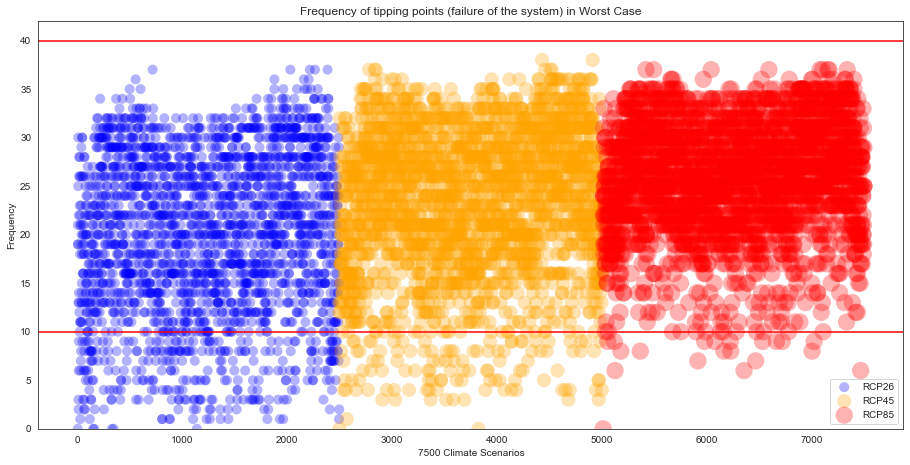

In [133]:
fig, ax1 = plt.subplots(figsize=(15.5,7.5))

ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 2)],T1RCP26[:], s = 100, c='b' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 2: len(matrix_GoodDays26) + len(matrix_GoodDays45) + 3],T1RCP45[:], s = 200, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 3:7504],T1RCP85[:-1], s = 300, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points (failure of the system) in Worst Case")
ax1.set_ylabel("Frequency")
ax1.set_xlabel("7500 Climate Scenarios")
ax1.set_ylim(bottom=0, top =42)
ax1.axhline(y=10, color='red')
ax1.axhline(y=40, color='red')

ax1.legend()


fig.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [134]:
from scipy.integrate import simps

def area_max_min_df (df, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario, dx=1)
    areamin1 = trapz(min_scenario, dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario, dx=1)
    areamin2 = simps(min_scenario, dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [135]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [136]:
max_scenario.to_numpy()

array([99.94362355, 99.99655673, 99.94172314, 99.96669503, 99.9971931 ,
       99.97796511, 99.99040661, 99.99021115, 99.95542522, 99.97385543,
       99.9694298 , 99.86933969, 99.98319827, 99.98283195, 99.97983249,
       99.98734827, 99.96801957, 99.99134561, 99.96620887, 99.98244223,
       99.99290207, 99.93142199, 99.88835323, 99.99430161, 99.92710909,
       99.98998021, 99.88932598, 99.96516212, 99.98027239, 99.88623896,
       99.92661435, 99.95035774, 99.9606008 , 99.98627993, 99.9923892 ,
       99.90463519, 99.98494313, 99.99126888, 99.97825115, 99.93344803,
       99.94003609, 99.92546221, 99.96117096, 99.99569323, 99.92359805,
       99.98440434, 99.95149205, 99.96231111, 99.98708504, 99.96506124,
       99.93610813, 99.98930089, 99.94721634, 99.92886507, 99.98054936,
       99.94857531, 99.98658758, 99.92998624, 99.72069621, 99.7724261 ,
       99.65350137, 99.97933755, 99.98521471, 99.94259351, 99.89859287,
       99.90186081, 99.95809401, 99.90096278, 99.67173635, 99.95

In [137]:
min_scenario.to_numpy()

array([ 10.3404877 , 100.00582647, 100.02548729, 100.0296601 ,
       100.01897557, 100.00268014, 100.01185998, 100.00836838,
        10.35139649,  10.11499875, 100.22829586, 100.00410784,
       100.0525879 , 100.01355301,  10.18431788,  10.04134287,
        10.42349235, 100.00119361, 100.1720663 ,  10.09639171,
       100.01883635,  10.00044838,  10.05021898,  10.14871946,
        10.01663558, 100.00907939,  10.25509591,  10.16682037,
        10.67812634, 100.06623396, 100.01173648,  10.0103136 ,
       100.09861098,  10.08912977,  10.25066198, 100.12536987,
        10.79008721,  10.54213964,  10.11072418,  10.27307923,
         1.61041113,  10.23531522,  10.02009967,   1.95754961,
       100.06240155, 100.08185178,  10.03385214,  10.19363461,
       100.12548066, 100.10686321,  10.0100571 ,  10.07218524,
        10.14093475,  10.11537241,  10.04586467,  10.3675811 ,
       100.02459046,  10.02706206, 100.06276572,  10.46066907,
         0.97021809,  10.02387191,  10.03294975,  10.17

In [138]:
max_scenario.shape

(118,)

In [139]:
print("Resort3 Worst Case")
area_max_min_df (df26_all, 118)
area_max_min_df (df45_all, 118)
area_max_min_df (df85_all, 118)

Resort3 Worst Case
Start************************************************************
Uncertainty Band1 =64.65 days
Uncertainty Band2 =64.68 days
****************************************End

Start************************************************************
Uncertainty Band1 =58.57 days
Uncertainty Band2 =58.60 days
****************************************End

Start************************************************************
Uncertainty Band1 =56.16 days
Uncertainty Band2 =56.16 days
****************************************End



## End